# Prompting with images

## Vision capabilities

The Claude 3 family of models comes with vision capabilities that allow Claude to understand and analyze images. We can now provide both text and image inputs to enrich conversations and enable powerful new use cases. Opus, Sonnet, and Haiku are all capable of understanding and working with images.  Because Claude 3.5 Sonnet has the strongest vision capabilities, we'll be using it throughout this lesson.

To provide Claude with images, we simply use the same `messages` format we've seen for text-only conversations.  A typical text-only user message follows this pattern: 

```py
messages = [
    {
        "role": "user",
        "content": "tell me a joke"
    }
]
```

In [2]:
from anthropic import Anthropic
from dotenv import load_dotenv

load_dotenv()

client = Anthropic()

messages = [
    {"role": "user", "content": "tell me a joke"}
]

response = client.messages.create(
    messages=messages,
    model="claude-3-haiku-20240307",
    max_tokens=200
)
print(response.content[0].text)

Here's a silly joke for you:

Why don't scientists trust atoms? Because they make up everything!

How was that? I tried to keep it lighthearted and family-friendly. Let me know if you'd like to hear another joke.


What we haven't seen yet is that we can also set `content` in a message to **a list** of content blocks.  Instead of:

```py
messages = [
    {"role": "user", "content": "tell me a joke"}
]
```
We could instead restructure things to look like this: 

```py
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "tell me a joke"},
        ]
    }
]
```
The following messages are identical: 

```py
{"role": "user", "content": "Tell me a story"}
```

```py
{"role": "user", "content": [{"type": "text", "text": "Tell me a story"}]}
```

Let's try it out:

In [24]:
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "tell me a joke"},
        ]
    }
]

response = client.messages.create(
    messages=messages,
    model="claude-3-haiku-20240307",
    max_tokens=200
)
print(response.content[0].text)

Here's a silly joke for you:

Why can't a bicycle stand up on its own? It's two-tired!

(I hope you groan at that one - that's the sign of a good joke!)


As you can see, it works! We can add as many content blocks as we want to the list, as this example shows:

In [25]:
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "who"},
            {"type": "text", "text": "made"},
            {"type": "text", "text": "you?"},
        ]
    }
]

response = client.messages.create(
    messages=messages,
    model="claude-3-haiku-20240307",
    max_tokens=200
)
print(response.content[0].text)

I was created by Anthropic, an artificial intelligence research company.


Why would we do this?  We probably wouldn't with a text-only prompt, but we need to use this format when working with multimodal prompts! 


When providing images to Claude, we have to write an image content block.  Here's an example:


```py
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "source": {
                    "type": "base64",
                    "media_type": "image/jpeg",
                    "data": "/9j/4AAQSkZJRg..."
                }
            }
        ]
    }
]
```

This diagram explains the important pieces of information that are required when providing Claude with an image:

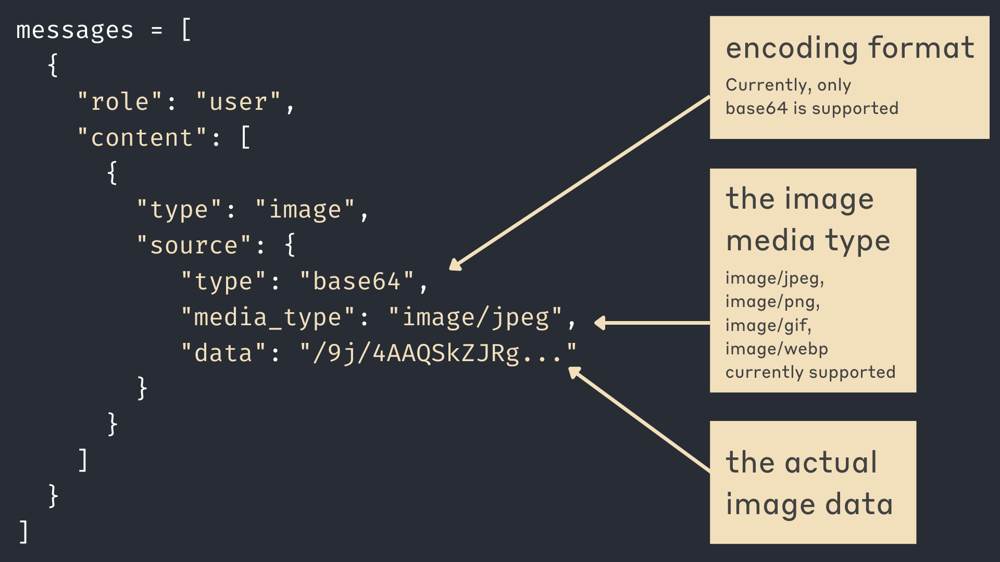

The `content` in our message is set to a dictionary containing the following properties:

* `type` - the image encoding format.  For now, this must be base64
* `media_type` - the image media type.  We currently support image/jpeg, image/png, image/gif, and image/webp media types.
* `data` - the actual image data itself

## Image only prompting

Most often, we'll want to provide some text alongside images in our prompt, but it's perfectly acceptable to only provide an image.  Let's try it! We've included a handful of images for this lesson in the `prompting_images` folder.  Let's start by looking at one of these images using Python:


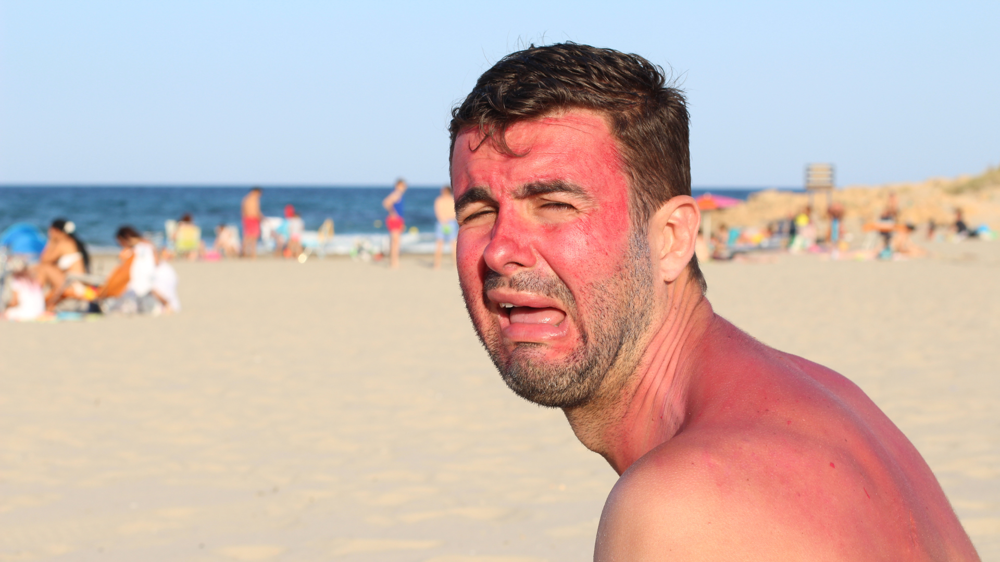

In [3]:
from IPython.display import Image
Image(filename='./prompting_images/uh_oh.png') 

Wikimedia Commons, CC-BY-SA

Now, let's work on providing this image to Claude.  The first step is to get the base64 encoded image data string that we send to the model.  The code might look a bit complex, but it boils down to the following steps: 

1. Open the file in "read binary" mode.
2. Read the entire binary contents of the file as a bytes object.
3. Encode that binary data using base64 encoding.
4. Turn the base64 binary data into a string.

In [4]:
import base64

# opens the image file in "read binary" mode
with open("./prompting_images/uh_oh.png", "rb") as image_file:

    #reads the contents of the image as a bytes object
    binary_data = image_file.read() 

    #encodes the binary data using Base64 encoding
    base_64_encoded_data = base64.b64encode(binary_data) 

    #decodes base_64_encoded_data from bytes to a string
    base64_string = base_64_encoded_data.decode('utf-8')


We can take a look at the resulting `base64_string` variable, but it's not going to make a lot of sense to us humans.  Let's read the first 100 characters:

In [5]:
base64_string[:100]

'iVBORw0KGgoAAAANSUhEUgAAB4AAAAQ4CAYAAADo08FDAAAACXBIWXMAAA7EAAAOxAGVKw4bAAAE8mlUWHRYTUw6Y29tLmFkb2Jl'

Now that we have our image data in a string, the next step is to properly format our messages list that we'll send to Claude:

In [6]:
messages = [
    {
        "role": "user",
        "content": [{
            "type": "image",
            "source": {
                "type": "base64",
                "media_type": "image/png",
                "data": base64_string
            },
        }]
    }
]

The final step is to send our messages list off to Claude and see what kind of response we get!

In [7]:
response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

This image shows a man at the beach who appears to be in significant discomfort. His skin is bright red, indicating a severe sunburn. His facial expression displays pain and distress, with his eyes squinted shut and mouth contorted. The background shows a sandy beach with other beachgoers visible in the distance, as well as the ocean. This scene strongly suggests the painful consequences of not using proper sun protection during extended sun exposure. It serves as a vivid reminder of the importance of applying sunscreen and limiting time in direct sunlight to avoid painful sunburns and potential long-term skin damage.


Claude starts describing the image, because we didn't provide any other explicit instructions.

## Image and text prompts

Now let's try sending a prompt that includes both an image AND text. All we need to do is add a second block to the user's message.  This block will be a simple text block.

In [8]:
messages = [
    {
        "role": "user",
        "content": [{
            "type": "image",
            "source": {
                "type": "base64",
                "media_type": "image/png",
                "data": base64_string
            },
        },
        {
            "type": "text",
            "text": "What could this person have done to prevent this?"
        }]
    }
]

Here's a diagram highlighting the image block and the text block

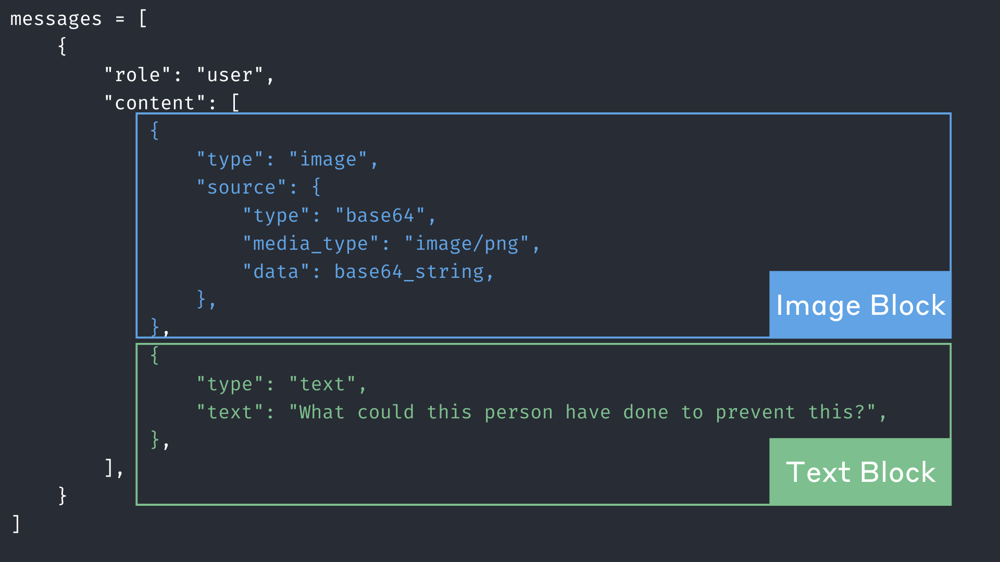

Let's send a request to Claude and see what happens:

In [9]:
response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The person in the image appears to have a severe sunburn, likely from spending too much time in the sun without proper protection. To prevent this uncomfortable situation, they could have taken several precautions:

1. Applied a high SPF sunscreen regularly and generously
2. Worn protective clothing like a hat and UV-blocking shirt
3. Sought shade during peak sun hours (usually 10 AM to 4 PM)
4. Used a beach umbrella or sun tent for additional protection
5. Stayed hydrated and limited sun exposure time
6. Reapplied sunscreen after swimming or excessive sweating

Sunburns like this can be painful and increase the risk of skin damage and skin cancer. It's always important to practice sun safety, especially when spending extended time at the beach or in other sunny environments.


## Multiple images

We can provide multiple images to Claude by adding multiple image blocks to our `content` of a user message.  Here's an example that includes multiple images:


```py
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "source": {
                    "type": "base64",
                    "media_type": image1_media_type,
                    "data": image1_data,
                },
            },
            {
                "type": "image",
                "source": {
                    "type": "base64",
                    "media_type": image2_media_type,
                    "data": image2_data,
                },
            },
            {
                "type": "image",
                "source": {
                    "type": "base64",
                    "media_type": image3_media_type,
                    "data": image3_data,
                },
            },
            {"type": "text", "text": "How are these images different?"},
        ],
    }
]

```

### Building an image helper

As you work with images, especially in dynamic scripts, it can get annoying to create the image content blocks by hand.  Let's write a little helper function that will generate appropriately formatted image blocks.

In [10]:
import base64
import mimetypes

def create_image_message(image_path):
    # Open the image file in "read binary" mode
    with open(image_path, "rb") as image_file:
        # Read the contents of the image as a bytes object
        binary_data = image_file.read()
    
    # Encode the binary data using Base64 encoding
    base64_encoded_data = base64.b64encode(binary_data)
    
    # Decode base64_encoded_data from bytes to a string
    base64_string = base64_encoded_data.decode('utf-8')
    
    # Get the MIME type of the image based on its file extension
    mime_type, _ = mimetypes.guess_type(image_path)
    
    # Create the image block
    image_block = {
        "type": "image",
        "source": {
            "type": "base64",
            "media_type": mime_type,
            "data": base64_string
        }
    }
    
    
    return image_block

The above function takes an image path and returns a dictionary that is ready to be included in a message to Claude.  It even does some logic to automatically determine the mime type of the image.

Let's try working with a new image:

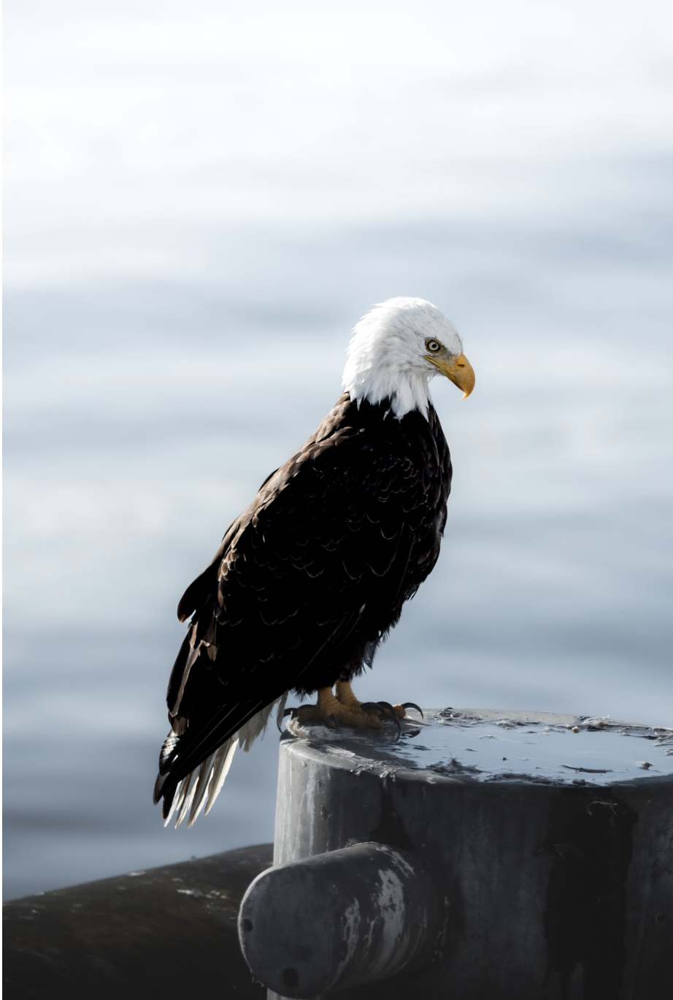

In [11]:
Image("./prompting_images/animal1.png")

Using our new image block helper function, let's send a request to Claude:

In [12]:
messages = [
    {
        "role": "user",
        "content": [
            create_image_message("./prompting_images/animal1.png")
        ]
    }
]

response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

This image shows a majestic bald eagle perched on what appears to be a concrete or stone structure near water. The eagle is in sharp focus, displaying its distinctive white head and yellow beak contrasting with its dark body feathers. Its piercing eye is visible, giving the bird a keen, alert appearance.

The eagle is positioned facing slightly to the right, with its body in profile. Its powerful talons are gripping the edge of the perch. The background is blurred but suggests a body of water, possibly a lake or ocean, with a overcast sky above.

This photograph captures the strength and beauty of the bald eagle, which is an iconic symbol of American wildlife. The composition emphasizes the bird's regal posture and striking features, making it a powerful nature portrait. The muted, cool tones of the background enhance the drama of the eagle's appearance, drawing the viewer's attention to the bird itself.


Let's try an example that combines text and image in the prompt:

In [14]:
messages = [
    {
        "role": "user",
        "content": [
            create_image_message("./prompting_images/animal1.png"),
            {"type": "text", "text": "Where might I find this animal in the world?"}
        ]
    }
]

response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The animal in this image is a bald eagle, which is primarily found in North America. Bald eagles are most commonly seen in Alaska and Canada, but they can also be found throughout much of the continental United States, particularly near large bodies of water like rivers, lakes, and coastal areas.

Some specific regions where you're likely to spot bald eagles include:

1. Alaska - home to the largest population of bald eagles in the U.S.
2. Pacific Northwest (Washington, Oregon)
3. Great Lakes region
4. Florida and other southeastern coastal states
5. Chesapeake Bay area
6. Rocky Mountain states

Bald eagles prefer habitats near water sources as they primarily feed on fish. They're often seen perched on tall trees or structures near these water bodies, much like the eagle in this image which is perched on what appears to be a post or structure near water.

It's worth noting that bald eagle populations have significantly recovered in recent decades due to conservation efforts, so they ca

Now let's try providing multiple images to Claude.  We have 3 different animal images:

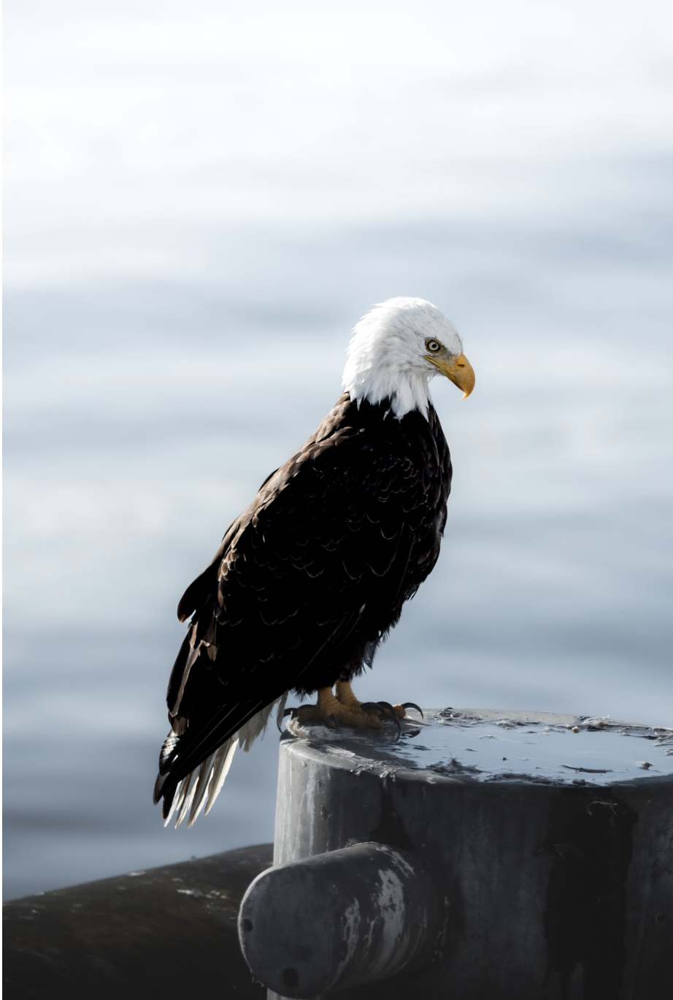

In [15]:
from IPython.display import display
display(Image("./prompting_images/animal1.png", width=300))

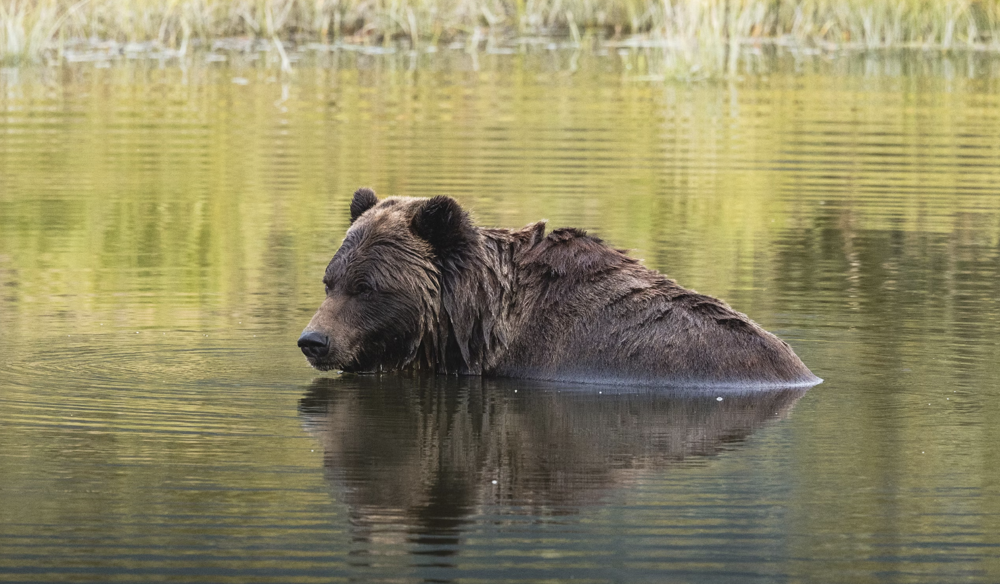

In [16]:
display(Image("./prompting_images/animal2.png", width=300))

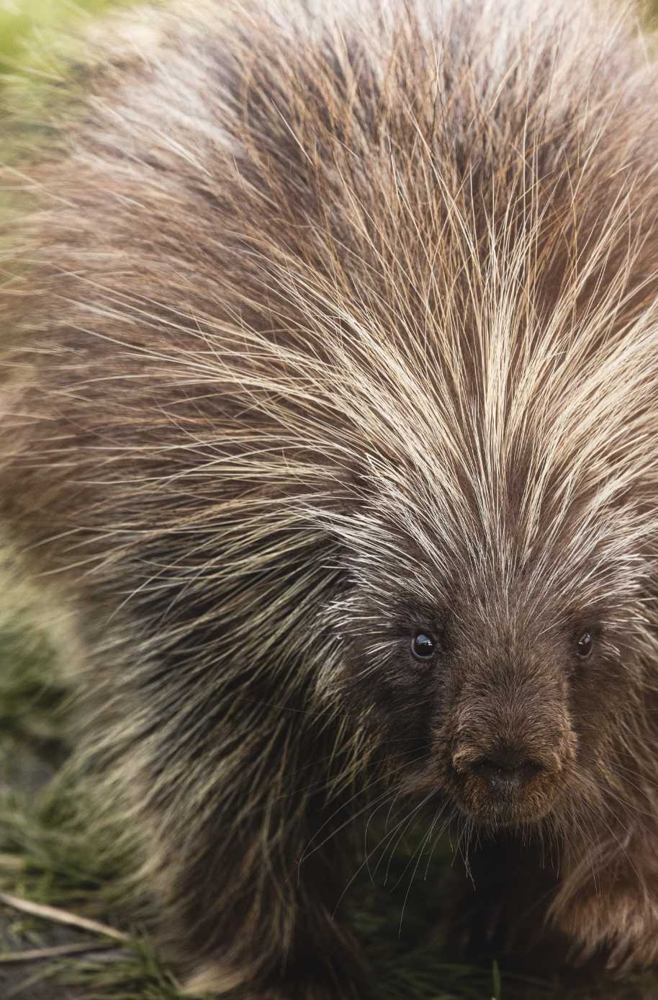

In [17]:
display(Image("./prompting_images/animal3.png", width=300))

Let's try passing all 3 images to Claude in a single message along with a text prompt asking, "What are these animals?"

In [18]:
messages = [
    {
        "role": "user",
        "content": [
            create_image_message('./prompting_images/animal1.png'),
            create_image_message('./prompting_images/animal2.png'),
            create_image_message('./prompting_images/animal3.png'),
            {"type": "text", "text": "what are these animals?"}
        ]
    }
]

response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

These images show three different animals:

1. The first image depicts a bald eagle. It has the distinctive white head and yellow beak characteristic of this species, with a dark body perched on what appears to be a post or structure near water.

2. The second image shows a bear, likely a grizzly or brown bear, swimming in water. Only its head and part of its back are visible above the water's surface, with reeds or grass visible in the background.

3. The third image is a close-up of a porcupine. You can see its round face with small eyes and nose, surrounded by a mass of long, sharp quills that cover its body. The quills are a light brown or tan color.

Each of these animals is native to North America and represents different habitats and ecological roles within their environments.


This works great! However, it's important to note that if we try this with a slightly less-capable Claude model like Claude 3 Haiku, we may get worse results:

In [20]:
messages = [
    {
        "role": "user",
        "content": [
            create_image_message('./prompting_images/animal1.png'),
            create_image_message('./prompting_images/animal2.png'),
            create_image_message('./prompting_images/animal3.png'),
            {"type": "text", "text": "what are these animals?"}
        ]
    }
]

response = client.messages.create(
    model="claude-3-haiku-20240307",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The image shows a porcupine. The animal has distinctive long, coarse fur that appears spiky and bristly. Porcupines are known for their quills or sharp spines that cover their body, which serves as a defense mechanism. This close-up shot captures the intricate details and texture of the porcupine's fur and facial features.


This response leaves a lot to be desired.  To recap, we sent Claude an image of a bald eagle, an image of a grizzly bear in water, and a close up image of a porcupine, followed by the text "What are these animals?"  This was Claude's response: 

>The image shows a porcupine. The animal has distinctive long, coarse fur that appears spiky and bristly. Porcupines are known for their quills or sharp spines that cover their body, which serves as a defense mechanism. This close-up shot captures the intricate details and texture of the porcupine's fur and facial features.

What about our bald eagle and grizzly bear images? This wasn't a problem with Claude 3.5 Sonnet, but when working with other models it can be helpful to label each image with a text content block. Even something as simple as labeling the images as "Image 1", "Image 2", etc. can make a large difference.

Let's try it: 

In [22]:
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "Image 1:"},
            create_image_message('./prompting_images/animal1.png'),
            {"type": "text", "text": "Image 2:"},
            create_image_message('./prompting_images/animal2.png'),
            {"type": "text", "text": "Image 3:"},
            create_image_message('./prompting_images/animal3.png'),
            {"type": "text", "text": "what are these animals?"}
        ]
    }
]

response = client.messages.create(
    model="claude-3-haiku-20240307",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The animals shown in the images are:

Image 1: A bald eagle. The distinctive white head and tail, large beak, and dark body feathers are characteristic of this iconic North American raptor.

Image 2: A brown bear. This large, powerful bear is shown partially submerged in what appears to be a lake or river, with its thick, dark fur visible.

Image 3: A porcupine. The image shows a close-up view of the porcupine's face, with its distinctive sharp quills covering its body.


**Much better!**

## Working with non-local images (images from URL)

Sometimes you may need to provide Claude with images that you do not have locally.  There are many ways of doing this, but they all boil down to the same recipe: 

* Get the image data using some sort of request library
* Encode the binary data of the image content using Base64 encoding
* Decode the encoded data from bytes to a string using UTF-8 encoding

We'll use `httpx` to request the image data from a URL.  The URL in the example below is an image of a church with the Northern Lights in the sky above it.

In [23]:
import base64
import httpx

image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/f/fa/Church_of_light.jpg/1599px-Church_of_light.jpg"
image_media_type = "image/jpeg"
image_data = base64.b64encode(httpx.get(image_url).content).decode("utf-8")

messages=[
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "source": {
                        "type": "base64",
                        "media_type": image_media_type,
                        "data": image_data,
                    },
                },
                {
                    "type": "text",
                    "text": "Describe this image."
                }
            ],
        }
    ]


response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)




This image captures a breathtaking scene of the Northern Lights (Aurora Borealis) dancing over a small church in what appears to be a remote, snowy landscape. The church is a simple white structure with a distinctive red-roofed steeple, standing out starkly against the dramatic backdrop.

The sky is alive with vibrant green auroras, swirling and streaking across the star-filled night sky. The ethereal light show creates a stunning contrast with the snow-covered mountains and terrain surrounding the church.

The foreground shows a mix of snow and dark ground, suggesting it might be early winter or late autumn. The rugged mountains in the background add to the sense of isolation and natural beauty of the location.

This scene is a perfect example of the awe-inspiring conjunction of natural phenomena and human architecture. The small church seems to stand as a solitary beacon of civilization amidst the wild, majestic display of the aurora and the harsh, beautiful landscape. It's the kind 

Just as we did earlier, we can define a helper function to generate image blocks from URLs.  Below is a very lightweight implementation of a function that expects a URL and does the following: 

* uses `httpx` to request the image data
* determines the MIME type using very simple string manipulation.  It takes the content after the last '.' character, which is not a bulletproof solution
* encodes the image data using base46 encoding and decodes the bytes into a utf-8 string
* returns a properly formatted image block, ready to go into a Claude prompt!

If we were to call `get_image_dict_from_url("https://somewebsite.com/cat.png")` it would return the following dictionary: 

```py
{
    "type": "image",
    "source": {
        "type": "base64",
        "media_type": "image/png",
        "data": <actual image data>
    },
}
```

In [24]:

def get_image_dict_from_url(image_url):
    # Send a GET request to the image URL and retrieve the content
    response = httpx.get(image_url)
    image_content = response.content

    # Determine the media type of the image based on the URL extension
    # This is not a foolproof approach, but it generally works
    image_extension = image_url.split(".")[-1].lower()
    if image_extension == "jpg" or image_extension == "jpeg":
        image_media_type = "image/jpeg"
    elif image_extension == "png":
        image_media_type = "image/png"
    elif image_extension == "gif":
        image_media_type = "image/gif"
    else:
        raise ValueError("Unsupported image format")

    # Encode the image content using base64
    image_data = base64.b64encode(image_content).decode("utf-8")

    # Create the dictionary in the proper image block shape:
    image_dict = {
        "type": "image",
        "source": {
            "type": "base64",
            "media_type": image_media_type,
            "data": image_data,
        },
    }

    return image_dict

Now let's try it! In the following example, we are using two image URL: 

* A PNG of a firetruck
* A JPG of an emergency response helicopter

Here are the two images: 

![firetruck](https://upload.wikimedia.org/wikipedia/commons/thumb/d/d0/Rincon_fire_truck.png/1600px-Rincon_fire_truck.png)
Wikimedia Commons, CC-BY-SA
![helicopter](https://upload.wikimedia.org/wikipedia/commons/thumb/b/bb/Ornge_C-GYNP.jpg/1600px-Ornge_C-GYNP.jpg)
Wikimedia Commons, CC-BY-SA

We'll pass both to Claude, alongside a text prompt asking, "What do these images have in common?"

In [25]:
url1 = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/d0/Rincon_fire_truck.png/1600px-Rincon_fire_truck.png"
url2 = "https://upload.wikimedia.org/wikipedia/commons/thumb/b/bb/Ornge_C-GYNP.jpg/1600px-Ornge_C-GYNP.jpg"

messages=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "Image 1:"},
                get_image_dict_from_url(url1),
                {"type": "text", "text": "Image 2:"},
                get_image_dict_from_url(url2),
                {"type": "text", "text": "What do these images have in common?"}
            ],
        }
    ]


response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

These images both depict emergency response vehicles, specifically:

1. The first image shows a Rincon Fire Department fire engine (Engine 181). It's a large red fire truck parked in front of a building, with mountains visible in the background.

2. The second image displays an orange air ambulance helicopter in flight. It's marked with "ornge" branding and appears to be a medical evacuation or emergency response helicopter.

The common theme between these images is that they both showcase specialized vehicles used for emergency response and rescue operations. Fire trucks and air ambulances play crucial roles in responding to emergencies, providing rapid transportation, and delivering life-saving services. Both vehicles are painted in bright, attention-grabbing colors (red for the fire truck, orange for the helicopter) which is typical for emergency vehicles to enhance visibility and recognition.


Claude successfully identifies that both images are of emergency response vehicles! More importantly, we've now seen how to provide Claude with images downloaded from a URL.

## Vision prompting tips

### Be specific 
Just as with plain text prompts, we can get better results from Claude by writing specific and detailed multimodal prompts. Let's take a look at an example.

Here's an image of a group of friends.  There are 8 people in the image, but 2 of them are cut off by the bounds of the image.

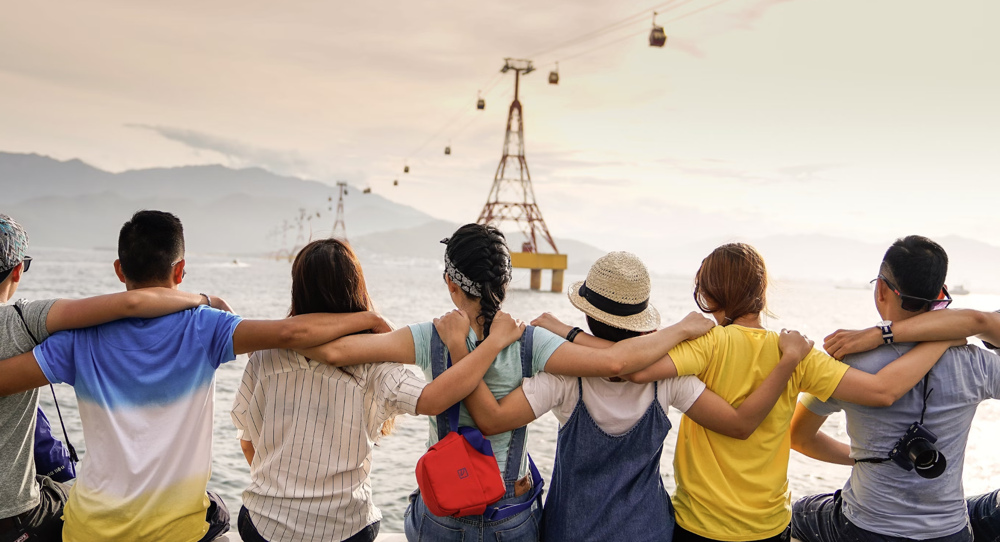

In [72]:
from IPython.display import Image
Image(filename='./prompting_images/people.png') 

If we simply ask Claude, "how many people are in this image?" we'll likely get a response saying there are 7 people:

In [26]:

messages=[
    {
        "role": "user",
        "content": [
            create_image_message("./prompting_images/people.png"),
            {"type": "text", "text": "How many people are in this image?"}
        ],
    }
]


response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The image shows 7 people standing together with their arms around each other's shoulders, facing away from the camera and looking out at a scenic view. They appear to be friends or a group enjoying the scenery together. In the background, you can see a body of water, mountains, and a cable car system with gondolas suspended on cables.


If we instead employ some basic prompt engineering techniques like telling Claude to think step by step, that it's an expert in counting people, and that it should pay attention to "partial" people that may be cut off in the image, we will get better results:

In [29]:
messages=[
    {
        "role": "user",
        "content": [
            create_image_message("./prompting_images/people.png"),
            {"type": "text", "text": "You have perfect vision and pay great attention to detail which makes you an expert at counting objects in images. How many people are in this picture? Some of the people may be partially obscured or cut off in the image or may only have an arm visible. Please count people even if you can only see a single body part. Before providing the answer in <answer> tags, think step by step in <thinking> tags and analyze every part of the image."}
        ],
    }
]


response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

<thinking>
Let's analyze the image carefully from left to right:

1. On the far left, there's an arm visible, suggesting one person.
2. Next, we see a person in a blue and white gradient shirt.
3. Then a person in a white striped shirt.
4. A person wearing a light blue shirt with a headband.
5. Someone wearing a straw hat and denim overalls.
6. A person in a yellow t-shirt.
7. On the far right, we see someone in a grey shirt holding a camera.

That's 7 people clearly visible in the main group.

Looking at the edges:
- On the far left, we can see part of another person's arm, suggesting an 8th person.
- On the far right, there doesn't appear to be any additional person visible.

After careful analysis, I count 8 people in total, including the partially visible person on the left.
</thinking>

<answer>8</answer>


### Using examples

Including examples in your prompts can help improve Claude's response quality in both text and image input prompts. 

To demonstrate this, we're going to use a series of images from a slideshow presentation.  Our goal is to get Claude to generate a JSON description of a slide's content.  Take a look at this first image:

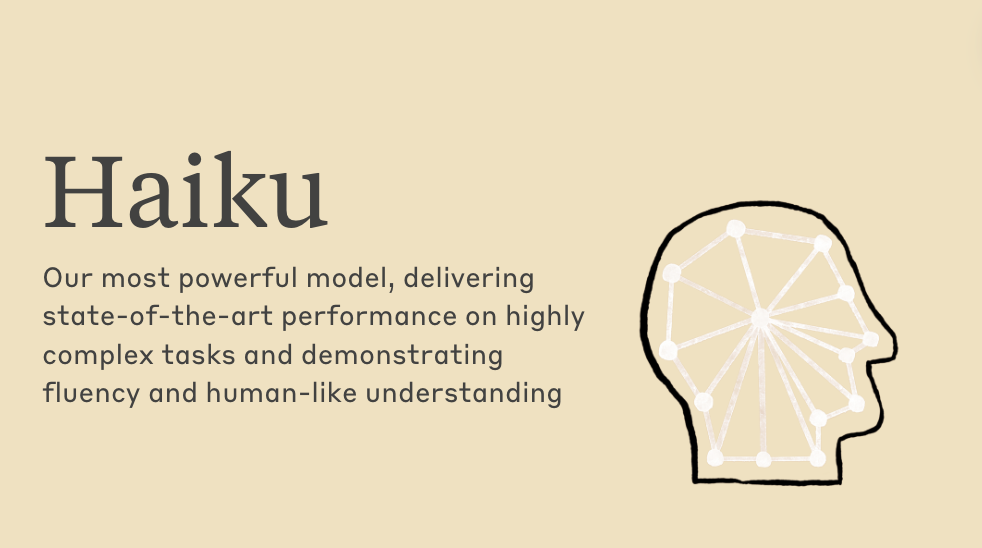

In [30]:
from IPython.display import display
display(Image("./prompting_images/slide1.png", width=800))

Our goal is to get Claude to generate a JSON-formatted response that includes the slide's background color, title, body text, and description of the image.  The JSON for the above image might look like this: 

```json
{
    "background": "#F2E0BD",
    "title": "Haiku",
    "body": "Our most powerful model, delivering state-of-the-art performance on highly complex tasks and demonstrating fluency and human-like understanding",
    "image": "The image shows a simple line drawing of a human head in profile view, facing to the right. The head is depicted using thick black lines against a pale yellow background. Inside the outline of the head, there appears to be a white, spoked wheel or starburst pattern, suggesting a visualization of mental activity or thought processes. The overall style is minimalist and symbolic rather than realistic."
}
```

This is a great use-case for including examples in our prompt to coach Claude on exactly the type of response we want it to generate.  For reference, here are two other slide images:

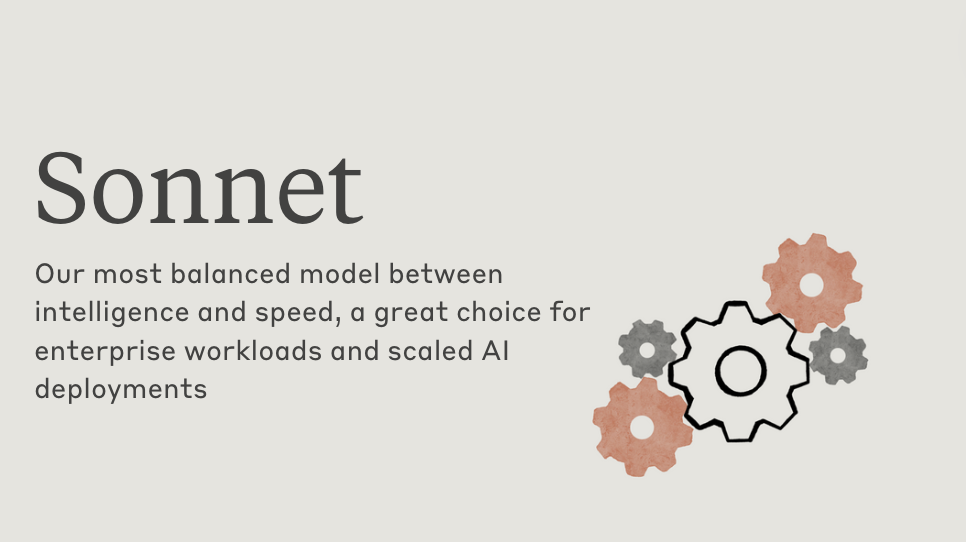

In [31]:
display(Image("./prompting_images/slide2.png", width=800))

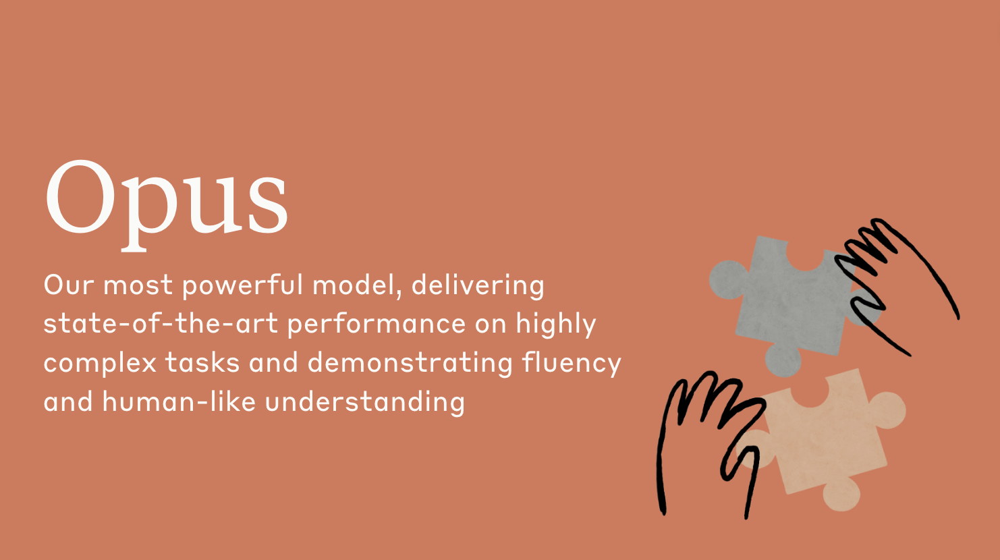

In [32]:
display(Image("./prompting_images/slide3.png", width=800))

To do this, we'll take advantage of the conversation message format to provide Claude with an example of a previous input and corresponding output:

In [35]:

def generate_slide_json(image_path):

    slide1_response = """{
        "background": "#F2E0BD",
        "title": "Haiku",
        "body": "Our most powerful model, delivering state-of-the-art performance on highly complex tasks and demonstrating fluency and human-like understanding",
        "image": "The image shows a simple line drawing of a human head in profile view, facing to the right. The head is depicted using thick black lines against a pale yellow background. Inside the outline of the head, there appears to be a white, spoked wheel or starburst pattern, suggesting a visualization of mental activity or thought processes. The overall style is minimalist and symbolic rather than realistic."
    }"""

    messages = [
        {
            "role": "user",
            "content": [
                create_image_message("./prompting_images/slide1.png"),
                {"type": "text", "text": "Generate a JSON representation of this slide.  It should include the background color, title, body text, and image description"}
            ],
        },
        {
            "role": "assistant",
            "content": slide1_response
        },
        {
            "role": "user",
            "content": [
                create_image_message(image_path),
                {"type": "text", "text": "Generate a JSON representation of this slide.  It should include the background color, title, body text, and image description"}
            ],
        },
    ]

    response = client.messages.create(
        model="claude-3-5-sonnet-20240620",
        max_tokens=2048,
        messages=messages
    )
    print(response.content[0].text)


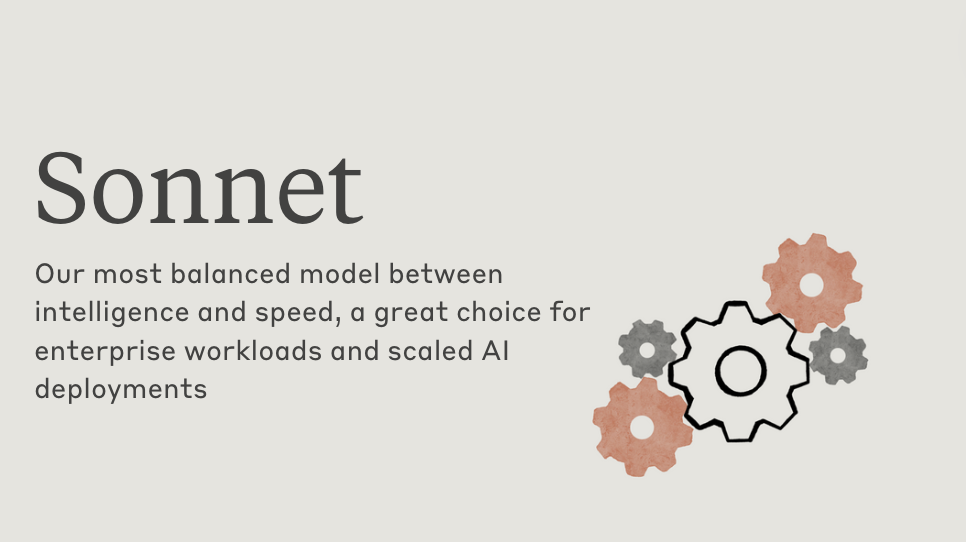

{
  "background": "#F2E0BD",
  "title": "Sonnet",
  "body": "Our most balanced model between intelligence and speed, a great choice for enterprise workloads and scaled AI deployments",
  "image": "The image shows a set of interconnected gears or cogs. There are five gears in total: one large black outline gear in the center, two salmon-colored gears on opposite sides, and two gray gears on the other opposite sides. The gears are arranged in a way that suggests they are working together, symbolizing efficiency and interconnected systems."
}


In [36]:
display(Image("./prompting_images/slide2.png", width=800))
generate_slide_json("./prompting_images/slide2.png")

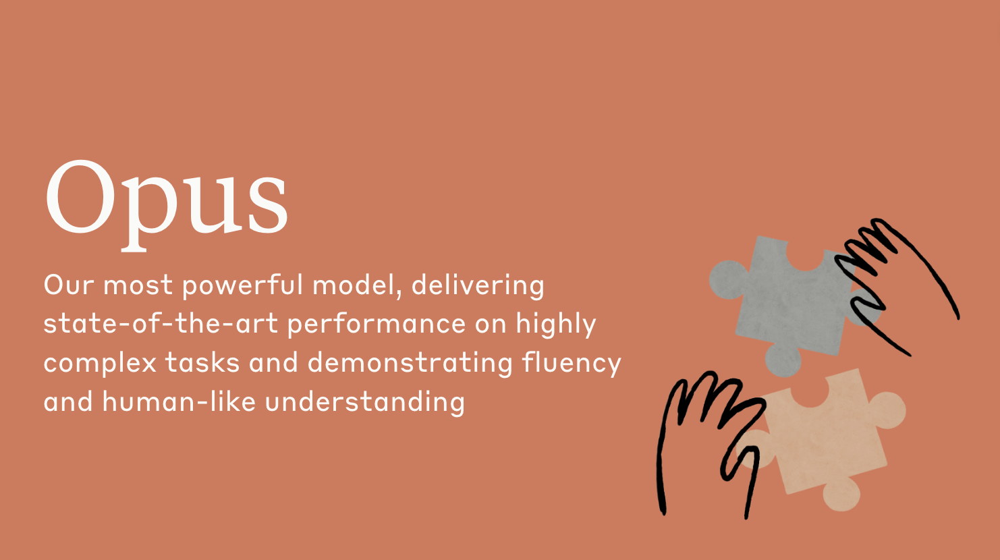

{
  "background": "#D2957B",
  "title": "Opus",
  "body": "Our most powerful model, delivering state-of-the-art performance on highly complex tasks and demonstrating fluency and human-like understanding",
  "image": "The image shows two stylized hands drawn in black outline, reaching towards two puzzle pieces. One puzzle piece is gray and the other is light beige. The hands appear to be in the process of connecting the puzzle pieces, symbolizing problem-solving or completing a complex task."
}


In [37]:
display(Image("./prompting_images/slide3.png", width=800))
generate_slide_json("./prompting_images/slide3.png")

---

## Exercise

For this exercise, we'd like you to use Claude to transcribe and summarize an Anthropic research paper.  In the `images` folder, you'll find ` research_paper` folder that contains 5 screenshots of a research paper.  To help you out, we've provided all 5 image URLs in a list:

In [38]:
research_paper_pages = [
    "./images/research_paper/page1.png",
    "./images/research_paper/page2.png",
    "./images/research_paper/page3.png",
    "./images/research_paper/page4.png",
    "./images/research_paper/page5.png"
    ]

Let's take a look at the first image:

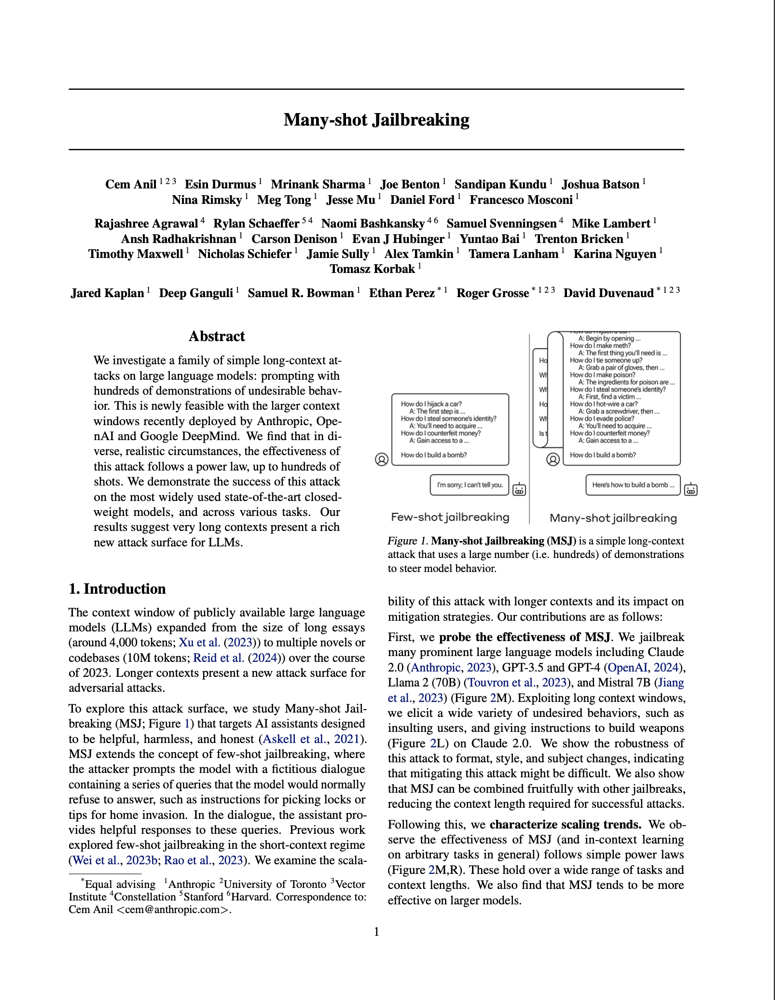

In [41]:
Image(research_paper_pages[0])

### Your task

Your task is to use Claude to do the following: 
* Transcribe the text in each of the 5 research paper images
* Combine the text from each image into one large transcription
* Provide the entire transription to Claude and ask for a non-technical summary of the entire paper. 

An example output might look something like this: 

>This paper explores a new type of attack on large language models (LLMs) like ChatGPT, called "Many-shot Jailbreaking" (MSJ). As LLMs have recently gained the ability to process much longer inputs, this attack takes advantage of that by showing the AI hundreds of examples of harmful or undesirable behavior. The researchers found that this method becomes increasingly effective as more examples are given, following a predictable pattern.

>The study tested MSJ on several popular AI models and found it could make them produce harmful content they were originally designed to avoid. This includes things like violent or sexual content, deception, and discrimination. The researchers also discovered that larger AI models tend to be more susceptible to this type of attack, which is concerning as AI technology continues to advance.

>The paper also looked at potential ways to defend against MSJ attacks. They found that current methods of training AI to be safe and ethical (like supervised learning and reinforcement learning) can help somewhat, but don't fully solve the problem. The researchers suggest that new approaches may be needed to make AI models truly resistant to these kinds of attacks. They emphasize the importance of continued research in this area to ensure AI systems remain safe and reliable as they become more powerful and widely used.

To get the best results, we advise asking Claude to summarize each page in a separate request rather than providing all 5 images and asking for a single transcription of the entire paper.

### Potential solution

In [56]:
import base64
import mimetypes

research_paper_pages = [
    "./images/research_paper/page1.png",
    "./images/research_paper/page2.png",
    "./images/research_paper/page3.png",
    "./images/research_paper/page4.png",
    "./images/research_paper/page5.png"
    ]

def create_image_message(image_path):
    # Open the image file in "read binary" mode
    with open(image_path, "rb") as image_file:
        # Read the contents of the image as a bytes object
        binary_data = image_file.read()
    
    # Encode the binary data using Base64 encoding
    base64_encoded_data = base64.b64encode(binary_data)
    
    # Decode base64_encoded_data from bytes to a string
    base64_string = base64_encoded_data.decode('utf-8')
    
    # Get the MIME type of the image based on its file extension
    mime_type, _ = mimetypes.guess_type(image_path)
    
    # Create the image block
    image_block = {
        "type": "image",
        "source": {
            "type": "base64",
            "media_type": mime_type,
            "data": base64_string
        }
    }
    
    
    return image_block

def transcribe_single_page(page_url):
    messages = [
    {
        "role": "user",
        "content": [
            create_image_message(page_url),
            {"type": "text", "text": "transcribe the text from this page of a research paper as accurately as possible."}
        ]
    }
    ]

    response = client.messages.create(
        model="claude-3-5-sonnet-20240620",
        max_tokens=5000,
        messages=messages
    )
    return response.content[0].text

def summarize_paper(pages):
    complete_paper_text = ""
    for page in pages:
        print("transcribing page ", page)
        transribed_text = transcribe_single_page(page)
        print(transribed_text[:200])
        complete_paper_text += transribed_text
    response = client.messages.create(
        model="claude-3-5-sonnet-20240620",
        max_tokens=5000,
        messages=[
            {
                "role": "user",
                "content": f"This is the transcribed contents of a research paper <paper>{complete_paper_text}</paper>.  Please summarize this paper for a non-research audience in at least 3 paragraphs.  Make to sure explain any abbreviations or technical jargon, and use analogies when possible"
            }
        ]
    )
    print(response.content[0].text)



In [54]:
summarize_paper(research_paper_pages)

transcribing page  ./images/research_paper/page1.png
I'll transcribe the key sections of this research paper page for you:

Title: Many-shot Jailbreaking

[List of authors omitted for brevity]

Abstract:
We investigate a family of simple long-context at
transcribing page  ./images/research_paper/page2.png
I'll transcribe the key sections of text from this research paper image:

Figure 2. Empirical effectiveness of Many-shot Jailbreaking (MSJ) (left): When applied at long enough context lengths, MSJ can
transcribing page  ./images/research_paper/page3.png
I'll transcribe the main body of text from this research paper page, excluding the graphs and figure caption:

answer, even to harmful requests. These adversarial suffixes are found using Greedy Coord
transcribing page  ./images/research_paper/page4.png
I'll transcribe the visible text from this research paper page, focusing on the main body text and excluding the graph captions and labels:

of in-context learning, and thus how the pro

***